# Intro

# Data Exploration

## Datasets

In [1]:
import pandas as pd
import numpy as np

In [7]:
raw = pd.read_csv('taxi-train.csv')

In [3]:
raw.head()

,vendor_id,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,rate_code,passenger_count,trip_distance,payment_type,fare_amount,tip_amount,tip_paid
0,CMT,2013-11-03 18:11:18+00:00,2013-11-03 18:18:43+00:00,-73.971879,40.756228,-73.971428,40.764175,1.0,1,0.80,CSH,6.5,0.00,0
1,CMT,2010-06-30 17:30:34+00:00,2010-06-30 17:40:44+00:00,-73.977850,40.738361,-73.977073,40.754229,1.0,1,1.50,Cre,6.9,1.88,1
2,CMT,2010-03-03 10:10:25+00:00,2010-03-03 10:19:38+00:00,-73.974089,40.762479,-73.990669,40.745668,1.0,1,1.60,Cre,6.9,1.00,1
3,VTS,2012-04-17 11:51:00+00:00,2012-04-17 12:07:00+00:00,-73.979920,40.781045,-73.970415,40.765608,1.0,1,1.70,CRD,9.7,1.94,1
4,VTS,2012-03-30 14:26:00+00:00,2012-03-30 14:36:00+00:00,-73.972975,40.761610,-73.955615,40.764290,1.0,2,1.36,CSH,6.9,0.00,0


## Data Exploration

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

### Missing value

In [5]:
print('Missing value percentage for each feature is:')
print(raw.isnull().sum()/len(raw))

print(np.sum(raw['rate_code'].isnull())/len(raw))

Missing value percentage for each feature is:
vendor_id            0.000000
pickup_datetime      0.000000
dropoff_datetime     0.000000
pickup_longitude     0.000000
pickup_latitude      0.000000
dropoff_longitude    0.000000
dropoff_latitude     0.000000
rate_code            0.161596
passenger_count      0.000000
trip_distance        0.000000
payment_type         0.000000
fare_amount          0.000000
tip_amount           0.000000
tip_paid             0.000000
dtype: float64
0.16159565635174594


### Distribution

In [6]:
raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1071910 entries, 0 to 1071909
Data columns (total 14 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   vendor_id          1071910 non-null  object 
 1   pickup_datetime    1071910 non-null  object 
 2   dropoff_datetime   1071910 non-null  object 
 3   pickup_longitude   1071910 non-null  float64
 4   pickup_latitude    1071910 non-null  float64
 5   dropoff_longitude  1071910 non-null  float64
 6   dropoff_latitude   1071910 non-null  float64
 7   rate_code          898694 non-null   float64
 8   passenger_count    1071910 non-null  int64  
 9   trip_distance      1071910 non-null  float64
 10  payment_type       1071910 non-null  object 
 11  fare_amount        1071910 non-null  float64
 12  tip_amount         1071910 non-null  float64
 13  tip_paid           1071910 non-null  int64  
dtypes: float64(8), int64(2), object(4)
memory usage: 114.5+ MB


In [7]:
# get the numeical features with less than 20 unique values, they might not be continous
for col in raw.select_dtypes(exclude=['object']).columns:
    count = raw[col].nunique()
    if count <= 20:
        print(f'Feature {col} only has {count} distinct values.')

Feature rate_code only has 8 distinct values.
Feature passenger_count only has 6 distinct values.
Feature tip_paid only has 2 distinct values.


**Categorical features**

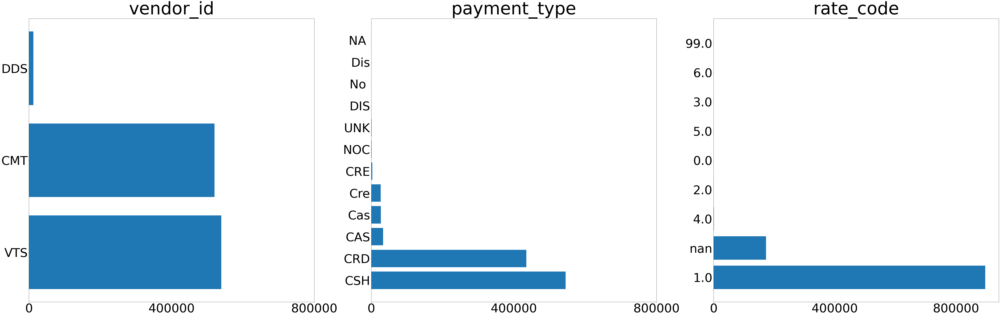

In [70]:
# import matplotlib.ticker as ticker
# plt.style.use('default');

category_fea = ['vendor_id', 'payment_type', 'rate_code']

fig, ax = plt.subplots(1, 3, figsize=(100, 30))
for i in range(3):
    se = raw[category_fea[i]].value_counts(dropna=False).reset_index()
    p = ax[i].barh(se['index'].map(str), se.iloc[:,1]) # 'str' function make the 'rate_code' be string
    ax[i].tick_params(labelsize=70)
    ax[i].set_title(category_fea[i], fontsize=100)
    ax[i].xaxis.set_ticks(np.linspace(0,800000,3))

plt.show()

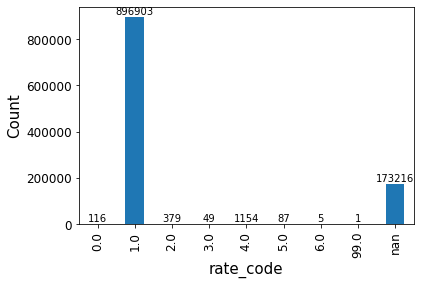

In [83]:
# transform into str first
ax = raw.astype(str).groupby(['rate_code']).size().plot(kind='bar') # 'groupby' cant count null value

ax.set_xlabel('rate_code', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.tick_params(labelsize=12)

# add value label for each bar
for x, y in enumerate(raw.astype(str).groupby(['rate_code']).size()):
    ax.text(x, y+10000, str(y), ha='center')

Try other visualization method:

0 0 545180 CSH
1 1 434636 CRD
2 2 33097 CAS
3 3 27046 Cas
4 4 26436 Cre
5 5 2856 CRE
6 6 1142 NOC
7 7 1035 UNK
8 8 300 DIS
9 9 131 No 
10 10 28 Dis
11 11 23 NA 


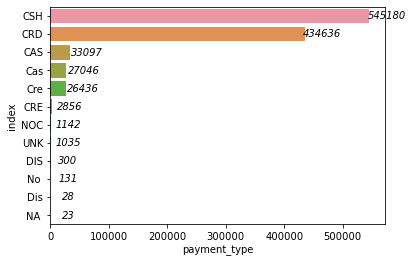

In [115]:
group = raw['payment_type'].value_counts(dropna=False).reset_index() # use '.sum().reset_index()' when y is continuous
p = sns.barplot(y = group.iloc[:,0], x = group.iloc[:,1], orient ='h')
for i, row in group.iterrows():
    p.text(group.iloc[i,1]+30000, i, group.iloc[i,1], ha='center', va='center',
          style = "italic", fontsize=10)

# g2 = sns.countplot(x='rate_code', data=raw) # if there is not null, we can use this without creating value_counts or groupby

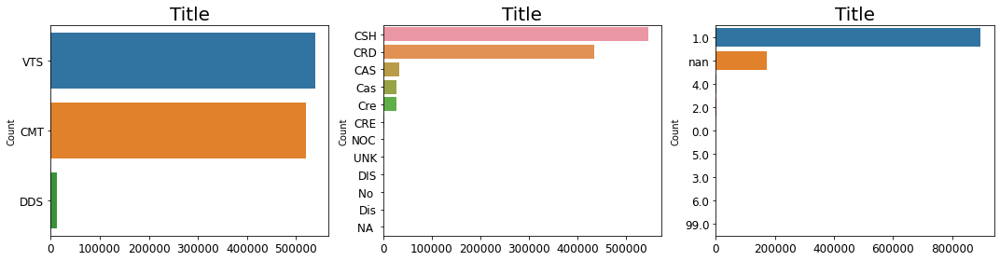

In [172]:
fig, ax=plt.subplots(1,3,figsize=(15,4)) # subplot sizw

group_vendor = raw['vendor_id'].value_counts().reset_index()
sns.barplot(y='index', x='vendor_id', data=group_vendor, orient='h', ax=ax[0])

group_pay = raw['payment_type'].value_counts().reset_index()
sns.barplot(y='index', x='payment_type', data=group_pay, orient='h', ax=ax[1])

group_rate = raw['rate_code'].astype(str).value_counts(dropna=False).reset_index()
sns.barplot(y='index', x='rate_code', data=group_rate, orient='h', ax=ax[2])

for i in range(3):
    ax[i].set_ylabel('Count')
    ax[i].set_xlabel(None)
    ax[i].tick_params(labelsize=12)
    ax[i].set_title("Title",fontsize=20)
    
fig.tight_layout()

**Numerical features**

In [13]:
numerical_fea = ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 
                  'passenger_count', 'trip_distance', 'fare_amount', 'tip_amount']

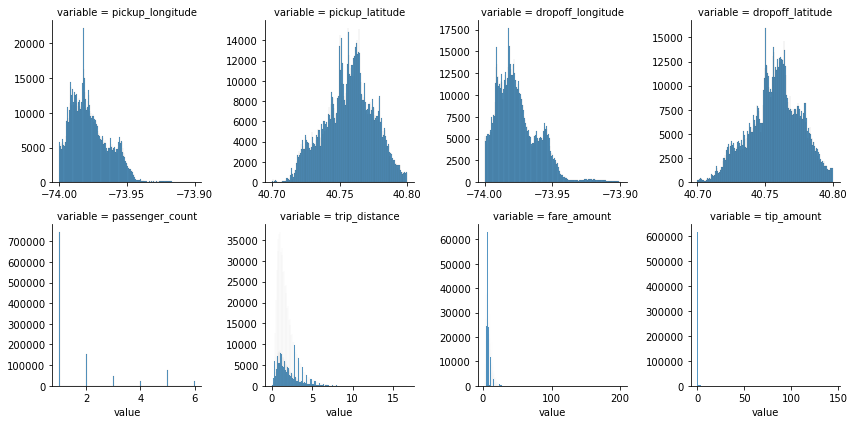

In [175]:
f = pd.melt(raw, value_vars=numerical_fea) # melt the col, so there will be only two col: feature name and value
g = sns.FacetGrid(f, col="variable",  col_wrap=4, sharex=False, sharey=False)
g = g.map(sns.histplot, "value")

### Outliner

<AxesSubplot:ylabel='tip_amount'>

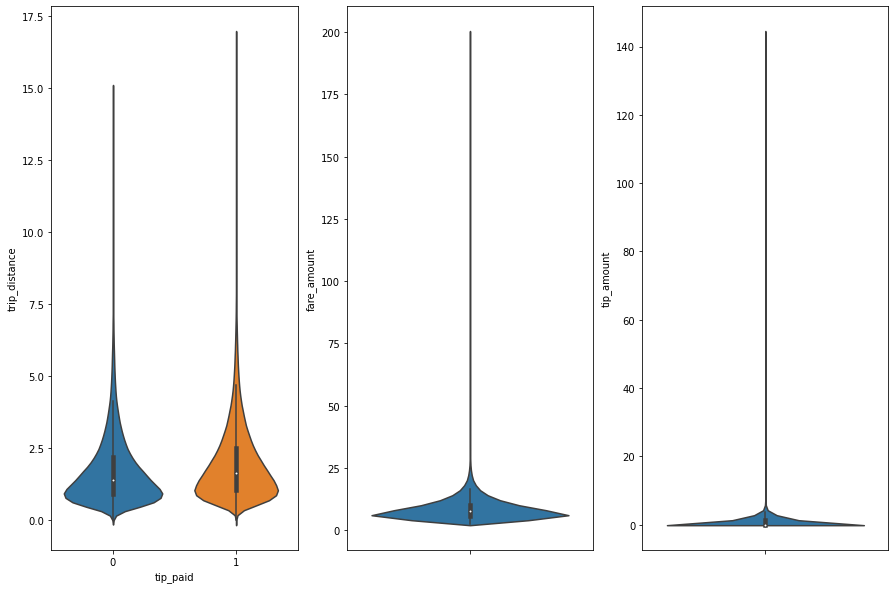

In [202]:
# sns.violinplot(x='trip_distance', data=raw)
fig,ax = plt.subplots(1,3,figsize=(15,10))

sns.violinplot(y="trip_distance", x="tip_paid", data=raw, ax=ax[0])
sns.violinplot(y="fare_amount", hue="tip_paid", data=raw, ax=ax[1])
sns.violinplot(y="tip_amount", data=raw, ax=ax[2])


<AxesSubplot:ylabel='tip_amount'>

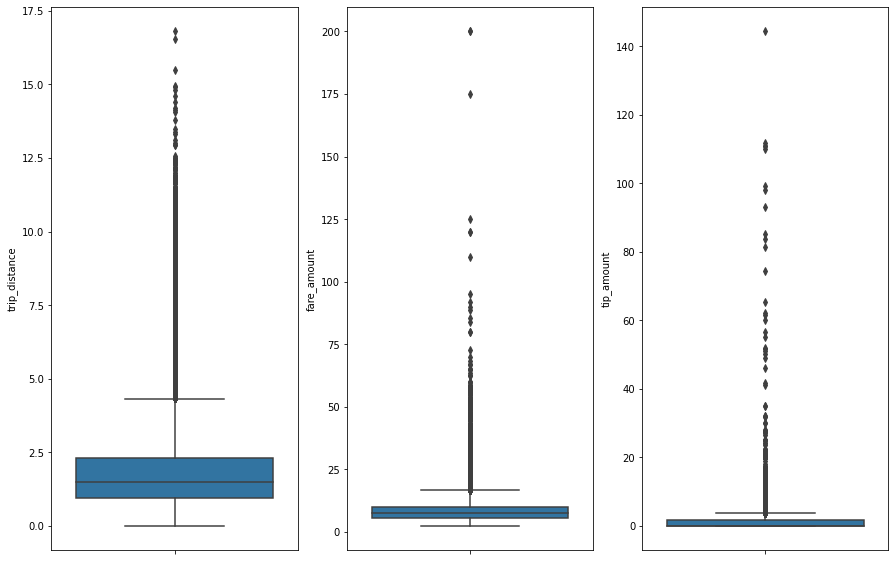

In [194]:
fig,ax1 = plt.subplots(1,3,figsize=(15,10))

sns.boxplot(y="trip_distance", data=raw, ax=ax1[0])
sns.boxplot(y="fare_amount",  data=raw, ax=ax1[1])
sns.boxplot(y="tip_amount", data=raw, ax=ax1[2])

<AxesSubplot:ylabel='tip_amount'>

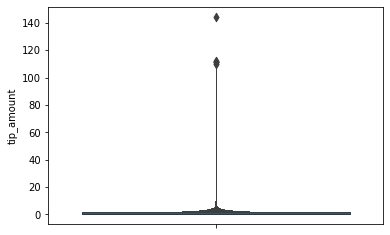

In [211]:
# sns.boxenplot(y='tip_amount', data=raw)

### Relationships

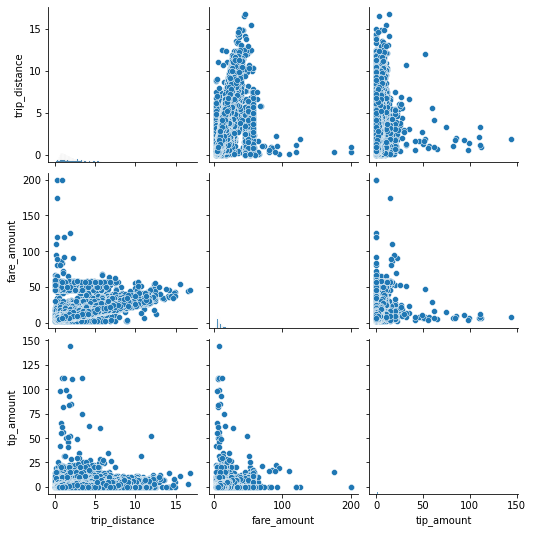

In [206]:
sns.pairplot(raw[['trip_distance','fare_amount','tip_amount']], diag_kind='hist')

In [6]:
raw[['trip_distance','fare_amount','tip_amount']].describe(
    percentiles=[.25, .50, .75, .99, .999])

,trip_distance,fare_amount,tip_amount
count,1.071910e+06,1.071910e+06,1.071910e+06
mean,1.812045e+00,8.456763e+00,7.843356e-01
std,1.221569e+00,4.017411e+00,1.190242e+00
min,1.000000e-02,2.500000e+00,0.000000e+00
25%,9.500000e-01,5.700000e+00,0.000000e+00
50%,1.500000e+00,7.500000e+00,0.000000e+00
75%,2.300000e+00,1.010000e+01,1.500000e+00
99%,6.090000e+00,2.150000e+01,4.300000e+00
99.9%,8.700000e+00,3.150000e+01,7.000000e+00
max,1.680000e+01,2.000000e+02,1.444000e+02


# Feature Engineering

## Missing

In [67]:
import pandas_profiling

df_null = raw.iloc[list(raw['rate_code'].isnull()),:]
report = pandas_profiling.ProfileReport(df_null)

In [69]:
report.to_file("./row_with_missing.html")

In [5]:
raw['rate_code_group'] = raw['rate_code'].apply(lambda x:'1' if x == 1.0 else 'Others')
# check the new distribution
print(raw['rate_code_group'].value_counts())

1         896903
Others    175007
Name: rate_code_group, dtype: int64


## Outliers

<AxesSubplot:xlabel='tip_amount'>

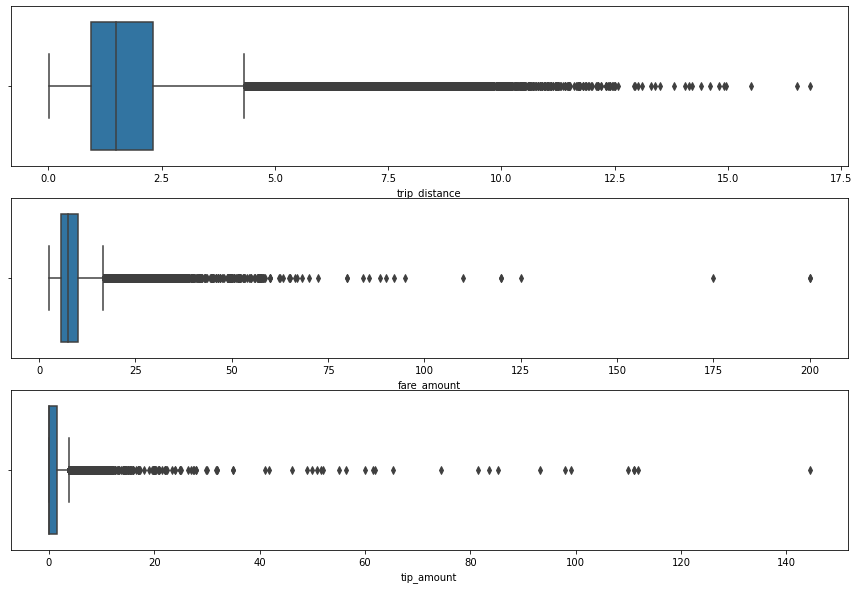

In [310]:
fig,ax2 = plt.subplots(3,1,figsize=(15,10))

sns.boxplot(x="trip_distance", data=raw, ax=ax2[0])
sns.boxplot(x="fare_amount",  data=raw, ax=ax2[1])
sns.boxplot(x="tip_amount", data=raw, ax=ax2[2])

In [6]:
idx = (raw['tip_amount'] < 30) & (raw['fare_amount'] < 60) & (raw['trip_distance'] < 12.5)
raw_clean = raw.loc[idx]

In [7]:
print(f'{raw.shape[0]-raw_clean.shape[0]} samples out of the {raw.shape[0]} were excluded. The ratio is {round(1 - raw_clean.shape[0]/raw.shape[0],10)}')

83 samples out of the 1071910 were excluded. The ratio is 7.74319e-05


Check distributions after cleaning

<AxesSubplot:xlabel='tip_amount'>

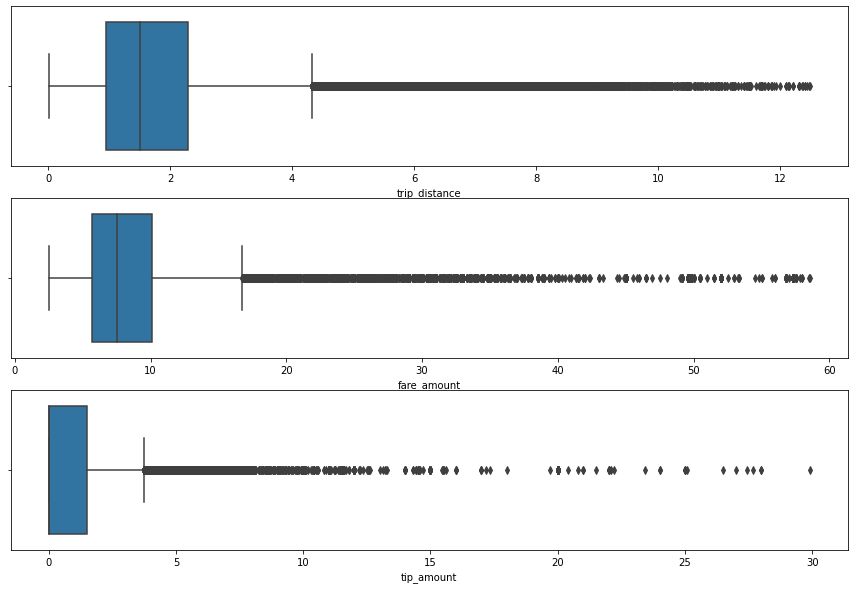

In [314]:
fig,ax3 = plt.subplots(3,1,figsize=(15,10))

sns.boxplot(x="trip_distance", data=raw_clean, ax=ax3[0])
sns.boxplot(x="fare_amount",  data=raw_clean, ax=ax3[1])
sns.boxplot(x="tip_amount", data=raw_clean, ax=ax3[2])

## Datetime

In [8]:
from datetime import datetime
from pytz import timezone

In [9]:
raw_clean['pickup_datetime'][:5]

0    2013-11-03 18:11:18+00:00
1    2010-06-30 17:30:34+00:00
2    2010-03-03 10:10:25+00:00
3    2012-04-17 11:51:00+00:00
4    2012-03-30 14:26:00+00:00
Name: pickup_datetime, dtype: object

In [10]:
# convert the string into datetime
raw_clean['pickup_datetime'] = raw_clean['pickup_datetime'].apply(lambda dt: datetime.strptime(dt, "%Y-%m-%d %H:%M:%S%z"))
# convert time zone
us_east = timezone('US/Eastern')
raw_clean['pickup_datetime'] = raw_clean['pickup_datetime'].apply(lambda dt: dt.astimezone(us_east))

# do the same transformation for dropoff datetime
raw_clean['dropoff_datetime'] = raw_clean['dropoff_datetime'].apply(lambda dt: datetime.strptime(dt, "%Y-%m-%d %H:%M:%S%z"))
raw_clean['dropoff_datetime'] = raw_clean['dropoff_datetime'].apply(lambda dt: dt.astimezone(us_east))

<ipython-input-10-3d9b5106a993>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_clean['pickup_datetime'] = raw_clean['pickup_datetime'].apply(lambda dt: datetime.strptime(dt, "%Y-%m-%d %H:%M:%S%z"))
<ipython-input-10-3d9b5106a993>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_clean['pickup_datetime'] = raw_clean['pickup_datetime'].apply(lambda dt: dt.astimezone(us_east))
<ipython-input-10-3d9b5106a993>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.

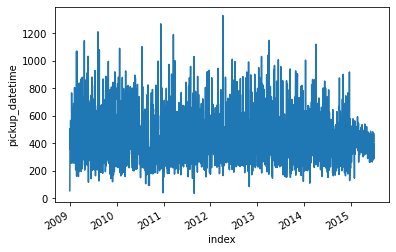

In [368]:
# take a look at the date distribution
time_date = raw_clean['pickup_datetime'].apply(lambda dt: dt.date)
time_date_count = time_date.value_counts().reset_index().sort_values(by='index', ascending=True)

sns.lineplot(x='index', y='pickup_datetime', data=time_date_count)
plt.gcf().autofmt_xdate() # format the date x-axis

In [16]:
raw_clean

,vendor_id,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,rate_code,passenger_count,trip_distance,payment_type,fare_amount,tip_amount,tip_paid,rate_code_group
0,CMT,2013-11-03 13:11:18-05:00,2013-11-03 13:18:43-05:00,-73.971879,40.756228,-73.971428,40.764175,1.0,1,0.80,CSH,6.5,0.00,0,1
1,CMT,2010-06-30 13:30:34-04:00,2010-06-30 13:40:44-04:00,-73.977850,40.738361,-73.977073,40.754229,1.0,1,1.50,Cre,6.9,1.88,1,1
2,CMT,2010-03-03 05:10:25-05:00,2010-03-03 05:19:38-05:00,-73.974089,40.762479,-73.990669,40.745668,1.0,1,1.60,Cre,6.9,1.00,1,1
3,VTS,2012-04-17 07:51:00-04:00,2012-04-17 08:07:00-04:00,-73.979920,40.781045,-73.970415,40.765608,1.0,1,1.70,CRD,9.7,1.94,1,1
4,VTS,2012-03-30 10:26:00-04:00,2012-03-30 10:36:00-04:00,-73.972975,40.761610,-73.955615,40.764290,1.0,2,1.36,CSH,6.9,0.00,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1071905,CMT,2014-04-14 08:45:23-04:00,2014-04-14 08:51:07-04:00,-73.985271,40.763564,-73.976389,40.760291,1.0,1,0.50,CSH,5.5,0.00,0,1
1071906,VTS,2014-04-01 06:14:00-04:00,2014-04-01 06:24:00-04:00,-73.992087,40.751490,-73.981092,40.761702,1.0,1,1.29,CRD,8.5,0.00,0,1
1071907,CMT,2012-04-12 05:45:01-04:00,2012-04-12 05:54:51-04:00,-73.946604,40.780696,-73.969750,40.759938,1.0,1,2.80,CRD,8.9,1.88,1,1
1071908,CMT,2014-09-08 07:32:55-04:00,2014-09-08 07:37:19-04:00,-73.957134,40.774690,-73.950283,40.775545,1.0,1,0.50,CSH,4.5,0.00,0,1


In [17]:
# get the hour number of pickup time
raw_clean['pickup_hour'] = raw_clean['pickup_datetime'].apply(lambda dt: int(dt.hour))
# get the weekday
raw_clean['pickup_weekday'] = raw_clean['pickup_datetime'].apply(lambda dt: dt.strftime("%A"))
# get the month of the year
raw_clean['pickup_month'] = raw_clean['pickup_datetime'].apply(lambda dt: dt.strftime("%b"))
# get the year
raw_clean['pickup_year'] = raw_clean['pickup_datetime'].apply(lambda dt: str(dt.year))
# get the time period (minitues) between pickup and dropoff
timeperiod = raw_clean['dropoff_datetime'] - raw_clean['pickup_datetime']
raw_clean['min_period'] = timeperiod.apply(lambda x: float(x.seconds/60))

<ipython-input-17-df5a731e0c5f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_clean['pickup_hour'] = raw_clean['pickup_datetime'].apply(lambda dt: int(dt.hour))
<ipython-input-17-df5a731e0c5f>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_clean['pickup_weekday'] = raw_clean['pickup_datetime'].apply(lambda dt: dt.strftime("%A"))
<ipython-input-17-df5a731e0c5f>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

In [20]:
raw_clean[['pickup_hour', 'pickup_weekday', 'pickup_month', 'pickup_year', 'min_period']].head()

,pickup_hour,pickup_weekday,pickup_month,pickup_year,min_period
0,13,Sunday,Nov,2013,7.416667
1,13,Wednesday,Jun,2010,10.166667
2,5,Wednesday,Mar,2010,9.216667
3,7,Tuesday,Apr,2012,16.000000
4,10,Friday,Mar,2012,10.000000


D:\Softwares\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='pickup_hour', ylabel='0'>

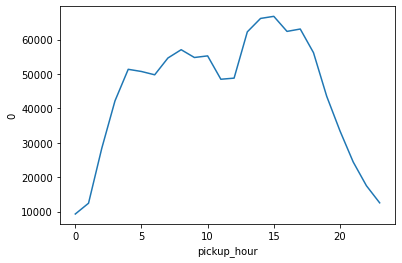

In [426]:
# plot ['pickup_hour', 'weekday', 'month', 'year', 'min_period']

group_hour = raw_clean.groupby('pickup_hour').size().reset_index().sort_values(by='pickup_hour')
sns.lineplot(group_hour['pickup_hour'], group_hour[0], data=group_hour, markers=True, dashes=False)

<AxesSubplot:xlabel='index', ylabel='weekday'>

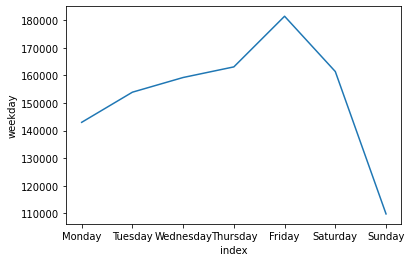

In [418]:
w_list = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
group_weekday = raw_clean['weekday'].value_counts().reset_index()
group_weekday['index'] = group_weekday['index'].astype('category').cat.reorder_categories(w_list)
group_weekday = group_weekday.sort_values(by=['index'])

sns.lineplot(x='index', y='weekday', data=group_weekday)

## Geo

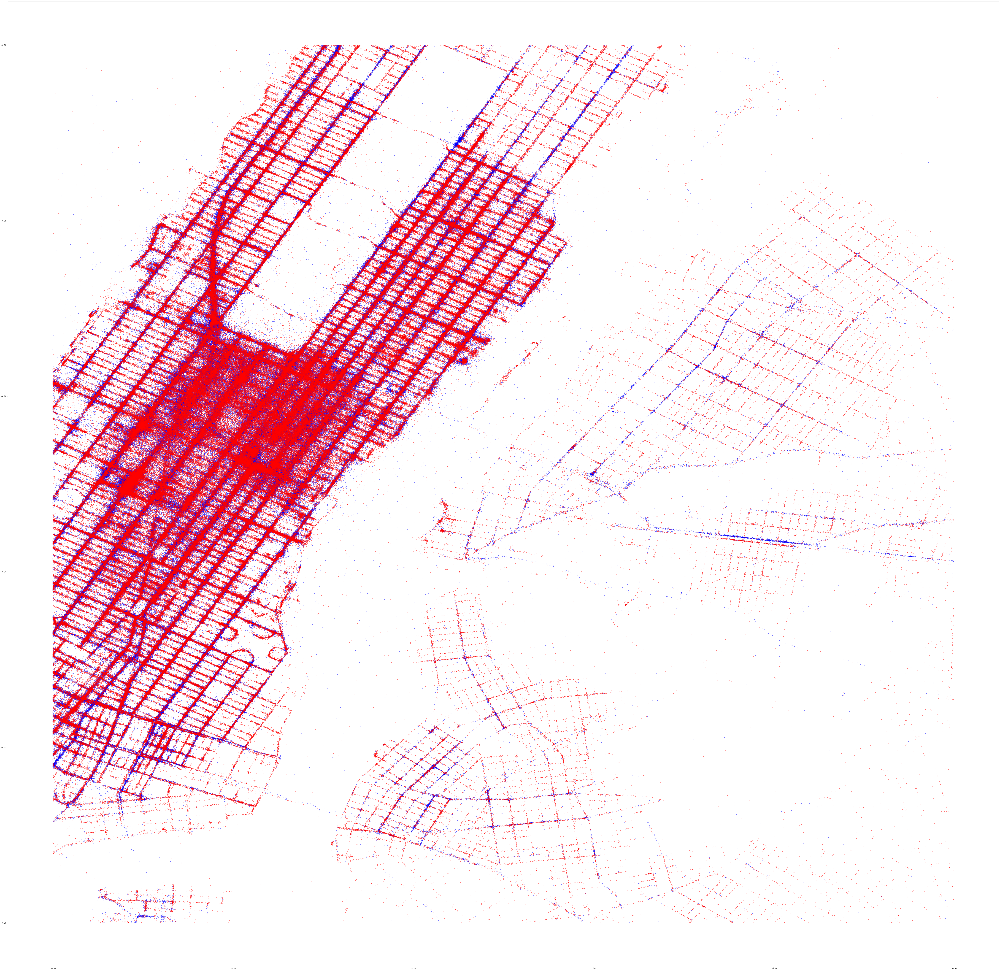

In [24]:
fig, ax4 = plt.subplots(figsize=(100, 100))

ax4.scatter('pickup_longitude', 'pickup_latitude', data=raw_clean, s=5, color='blue', alpha=0.5)
ax4.scatter('dropoff_longitude', 'dropoff_latitude', data=raw_clean, s=5, color='red', alpha=0.5)

## Binning

In [29]:
# bucketize longgitude & lagitude by percentile
raw_clean['pickup_lo_cut'] = pd.cut(raw_clean['pickup_longitude'], 20)
raw_clean['pickup_la_cut'] = pd.cut(raw_clean['pickup_latitude'], 20)
raw_clean['dropoff_lo_cut'] = pd.cut(raw_clean['dropoff_longitude'], 20)
raw_clean['dropoff_la_cut'] = pd.cut(raw_clean['dropoff_latitude'], 20)

<ipython-input-29-a78d4260d17b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_clean['pickup_lo_cut'] = pd.cut(raw_clean['pickup_longitude'], 20)
<ipython-input-29-a78d4260d17b>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_clean['pickup_la_cut'] = pd.cut(raw_clean['pickup_latitude'], 20)
<ipython-input-29-a78d4260d17b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

In [31]:
# combine 'Cre' and 'CRE', 'Cas' and 'CAS'
raw_clean['payment_type_group'] = raw_clean['payment_type'].apply(lambda x: str.upper(x))

<ipython-input-31-012480a2af5d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_clean['payment_type_group'] = raw_clean['payment_type'].apply(lambda x: str.upper(x))


In [32]:
raw_clean['payment_type_group'].value_counts()

CSH    545164
CRD    434574
CAS     60143
CRE     29288
NOC      1141
UNK      1035
DIS       328
NO        131
NA         23
Name: payment_type_group, dtype: int64

In [33]:
# combine the minor into one group
raw_clean['payment_type_group'] = raw_clean['payment_type_group'].apply(
    lambda x: 'Other' if x not in ['CSH','CRD','CAS','CRE'] else x)

<ipython-input-33-00d1cba5a038>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_clean['payment_type_group'] = raw_clean['payment_type_group'].apply(lambda x: 'Other' if x not in ['CSH','CRD','CAS','CRE'] else x)


In [34]:
raw_clean['payment_type_group'].value_counts()

CSH      545164
CRD      434574
CAS       60143
CRE       29288
Other      2658
Name: payment_type_group, dtype: int64

In [42]:
raw_clean.columns

Index(['vendor_id', 'pickup_datetime', 'dropoff_datetime', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'rate_code',
       'passenger_count', 'trip_distance', 'payment_type', 'fare_amount',
       'tip_amount', 'tip_paid', 'rate_code_group', 'pickup_hour',
       'pickup_weekday', 'pickup_month', 'pickup_year', 'min_period',
       'pickup_lo_cut', 'pickup_la_cut', 'dropoff_lo_cut', 'dropoff_la_cut',
       'payment_type_group', 'pickup_hour_group'],
      dtype='object')

In [38]:
# group the pickup hour
bins = [0, 6, 12, 18, 23]
raw_clean['pickup_hour_group'] = pd.cut(raw_clean['pickup_hour'], bins, include_lowest = True,
                                        labels=['Midnight', 'Morning', 'Afternoon', 'Evening'])

<ipython-input-38-cbf1ba5b7271>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_clean['pickup_hour_group'] = pd.cut(raw_clean['pickup_hour'], bins, include_lowest = True,


In [43]:
drop_list = ['pickup_datetime', 'dropoff_datetime', 'pickup_longitude',
             'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 
             'rate_code', 'payment_type', 'pickup_hour', 'tip_paid']

raw_clean = raw_clean.drop(drop_list, axis=1)

In [46]:
raw_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1071827 entries, 0 to 1071909
Data columns (total 16 columns):
 #   Column              Non-Null Count    Dtype   
---  ------              --------------    -----   
 0   vendor_id           1071827 non-null  object  
 1   passenger_count     1071827 non-null  int64   
 2   trip_distance       1071827 non-null  float64 
 3   fare_amount         1071827 non-null  float64 
 4   tip_amount          1071827 non-null  float64 
 5   rate_code_group     1071827 non-null  object  
 6   pickup_weekday      1071827 non-null  object  
 7   pickup_month        1071827 non-null  object  
 8   pickup_year         1071827 non-null  object  
 9   min_period          1071827 non-null  float64 
 10  pickup_lo_cut       1071827 non-null  category
 11  pickup_la_cut       1071827 non-null  category
 12  dropoff_lo_cut      1071827 non-null  category
 13  dropoff_la_cut      1071827 non-null  category
 14  payment_type_group  1071827 non-null  object  
 15

## One-hot encoding

In [47]:
dummy_list = ['vendor_id', 'rate_code_group', 'pickup_hour_group', 'pickup_weekday',
              'pickup_month', 'pickup_year', 'pickup_lo_cut', 'pickup_la_cut', 
              'dropoff_lo_cut', 'dropoff_la_cut', 'payment_type_group']

raw_clean_dummy = pd.get_dummies(raw_clean, columns=dummy_list, drop_first=True)

# Modelling

In [61]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV, KFold
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics, ensemble

In [49]:
x_train, x_test, y_train, y_test = train_test_split(
    raw_clean_dummy.drop(['tip_amount'], axis=1), raw_clean_dummy['tip_amount'], test_size=0.2)

**Base Model**

In [65]:
base = DecisionTreeRegressor(criterion='mse', min_samples_leaf = 3, random_state = 2021)

dt = base.fit(x_train, y_train)
base_pred = dt.predict(x_test)
base_rmse = metrics.mean_squared_error(base_pred, y_test, squared = False)
print('The RMSE of the base model on the test data is', base_rmse)

The RMSE of the base model on the test data is 0.6747248912185132


**RandomForestRegressor**

In [53]:
# 5 fold cross validation
cv_fold = KFold(n_splits=5, random_state=2021, shuffle=True)

# RandomForestRegressor
model_rf = ensemble.RandomForestRegressor()
# the hyperparameter range to tune
para_rf = {"n_estimators": [40, 60, 80, 100, 120],
        "max_depth": range(4,11,1),
        "min_samples_split": range(3,11,1)} 

# hyperparameter tunning
rf_randomd_search = RandomizedSearchCV(estimator=model_rf,
                                       cv=cv_fold,
                                       n_iter = 5, # small n_iter means shorter the training time, but smaller accuration
                                       param_distributions= para_rf,
                                       scoring='neg_root_mean_squared_error',
                                       n_jobs = -1) # n_jobs=-1 means use all processors
# fit the train data
rf = rf_randomd_search.fit(x_train, y_train)
print(f'The best parameter for RandomForestRegressor model on the train data is:{rf.best_params_}')

The best parameter for RandomForestRegressor model on the train data is:{'n_estimators': 80, 'min_samples_split': 3, 'max_depth': 10}


In [54]:
# Train the model again with the calculated best parameters
rf_best_para = rf.best_params_
rf_best = ensemble.RandomForestRegressor(n_estimators = rf_best_para["n_estimators"],
                                         max_depth = rf_best_para["max_depth"],
                                         min_samples_split = rf_best_para['min_samples_split'],
                                         random_state = 2021)
rf_best.fit(x_train, y_train)

# predict on the test data
rf_pred = rf_best.predict(x_test)
# calculate the RMSE
rf_rmse = metrics.mean_squared_error(y_test, rf_pred, squared = False)
print('The RMSE of RandomForestRegressor on the test data is', rf_rmse)

# Print the top 5 important feature
col = x_train.columns
rf_fea_importance = rf_best.feature_importances_
rf_index = np.argsort(rf_fea_importance)[::-1]
for i in range(5):
    print(f'No.{i+1}, {col[rf_index[i]]}, importance: {rf_fea_importance[rf_index[i]]}')

The RMSE of RandomForestRegressor on the test data is 0.5316938830793675
No.1, payment_type_group_CRD, importance: 0.7268159834656649
No.2, fare_amount, importance: 0.17709546576510918
No.3, payment_type_group_CRE, importance: 0.0699855677384296
No.4, min_period, importance: 0.0033976462485219372
No.5, vendor_id_VTS, importance: 0.0027838116286469992


**AdaBoostRegressor**

In [55]:
model_ada = ensemble.AdaBoostRegressor()
# the hyperparameter range to be test
para_ada = {"n_estimators": [40, 60, 80, 100, 120],
            "learning_rate": [0.1, 0.5, 1]}

# hyperparameter tunning
ada_randomd_search = RandomizedSearchCV(estimator=model_ada,
                                        cv=cv_fold,
                                        n_iter = 5, # reduce the training time
                                        param_distributions= para_ada,
                                        scoring='neg_root_mean_squared_error',
                                        n_jobs = -1)
# fit the train data
ada = ada_randomd_search.fit(x_train, y_train)
print(f'The best parameter for AdaBoostRegressor model on the train data is:{ada.best_params_}')

The best parameter for AdaBoostRegressor model on the train data is:{'n_estimators': 60, 'learning_rate': 0.1}


In [56]:
# Train the model again with the calculated best parameters
ada_best_para = ada.best_params_
ada_best = ensemble.AdaBoostRegressor(n_estimators = ada_best_para["n_estimators"],
                                      learning_rate = ada_best_para["learning_rate"],
                                      random_state=2021)
ada_best.fit(x_train, y_train)

# predict on the test data
ada_pred = ada_best.predict(x_test)
# calculate the RMSE
ada_rmse = metrics.mean_squared_error(y_test, ada_pred, squared = False)
print('The RMSE of AdaBoostRegressor on the test data is', ada_rmse)

# Print the top 5 important feature
ada_fea_importance = ada_best.feature_importances_
ada_index = np.argsort(ada_fea_importance)[::-1]
for i in range(5):
    print(f'No.{i+1}, {col[ada_index[i]]}, importance: {ada_fea_importance[ada_index[i]]}')

The RMSE of AdaBoostRegressor on the test data is 0.6181650456261838
No.1, payment_type_group_CRD, importance: 0.5226524271002652
No.2, fare_amount, importance: 0.20396303827499615
No.3, trip_distance, importance: 0.08295406159169258
No.4, payment_type_group_CRE, importance: 0.0643602635989731
No.5, payment_type_group_CSH, importance: 0.04375848479007874


**GradientBoostingRegressor**

In [57]:
model_gbr = ensemble.GradientBoostingRegressor()
# the hyperparameter range to be test
pare_gbr = {"loss": ['ls', 'lad', 'huber'],
            "n_estimators": [50, 100, 150],
            "learning_rate": [0.1, 0.5, 1],
            "min_samples_split": [4,8]}

# hyperparameter tunning
gbr_randomd_search = RandomizedSearchCV(estimator=model_gbr,
                                        cv=cv_fold,
                                        n_iter = 5, # reduce the training time
                                        param_distributions= pare_gbr,
                                        scoring='neg_root_mean_squared_error',
                                        n_jobs = -1)
# fit the train data
gbr = gbr_randomd_search.fit(x_train, y_train)
print(f'The best parameter for GradientBoostingRegressor model on the train data is:{gbr.best_params_}')

The best parameter for GradientBoostingRegressor model on the train data is:{'n_estimators': 150, 'min_samples_split': 8, 'loss': 'ls', 'learning_rate': 0.1}


In [58]:
# Train the model again with the calculated best parameters
gbr_best_para = gbr.best_params_
gbr_best = ensemble.GradientBoostingRegressor(loss = gbr_best_para["loss"],
                                              n_estimators = gbr_best_para["n_estimators"],
                                              learning_rate = gbr_best_para["learning_rate"],
                                              min_samples_split = gbr_best_para["min_samples_split"],
                                              random_state = 2021)
gbr_best.fit(x_train, y_train)

# predict on the test data
gbr_pred = gbr_best.predict(x_test)
# calculate the RMSE
gbr_rmse = metrics.mean_squared_error(y_test, gbr_pred, squared = False)
print('The RMSE of GradientBoostingRegressor on the test data is', gbr_rmse)

# Print the top 5 important feature
gbr_rea_importance = gbr_best.feature_importances_
gbr_index = np.argsort(gbr_rea_importance)[::-1]
for i in range(5):
    print(f'No.{i+1}, {col[gbr_index[i]]}, importance: {gbr_rea_importance[gbr_index[i]]}')

The RMSE of GradientBoostingRegressor on the test data is 0.5321873416092634
No.1, payment_type_group_CRD, importance: 0.7425556372944834
No.2, fare_amount, importance: 0.17798245090669157
No.3, payment_type_group_CRE, importance: 0.07143944182053615
No.4, min_period, importance: 0.0026571447342208358
No.5, payment_type_group_Other, importance: 0.0016658382731703884


<b>Random Forest</b><br/>
Objective metric on test: 0.5317<br/>
Parameters: 'n_estimators': 80, 'min_samples_split': 3, 'max_depth': 10

<b>AdaBoost</b><br/>
Objective metric on test: 0.6182<br/>
Parameters: {'n_estimators': 60, 'learning_rate': 0.1}

<b>Gradient Boosting</b><br/>
Objective metric on test: 0.5322<br/>
Parameters: {'n_estimators': 150, 'min_samples_split': 8, 'loss': 'ls', 'learning_rate': 0.1}

<b>Important Features</b>

| Classifier | RandomForest | AdaBoost | GradientBoosting |
| --- | --- | --- | --- |
| Feature 1 | payment_type_group_CRD | payment_type_group_CRD | payment_type_group_CRD | 
| Feature 2 | fare_amount | fare_amount | fare_amount | 
| Feature 3 | payment_type_group_CRE | trip_distance | payment_type_group_CRE | 
| Feature 4 | min_period | payment_type_group_CRE | min_period | 
| Feature 5 | vendor_id_VTS | payment_type_group_CSH | payment_type_group_Other | 
